# Using Pretrained Model Weights from Kaggle

#### This notebook is the first step in our pipeline where we load a pre-trained Detectron2 model and use it to predict where the holds are located within the images of the climbing walls. We input the images in data/images and receive a structured output. To prepare the model outputs for our dataset, we took the predictions produced by Detectron2 and reorganized them into the COCO formatuse the model to create on a set of images. 

### Install Dependencies

In [4]:
!pip install --no-build-isolation 'git+https://github.com/facebookresearch/detectron2.git'
!pip install kagglehub
!pip install torchvision
!pip install opencv-python



  Cloning https://github.com/facebookresearch/detectron2.git to /private/var/folders/97/0ktd2h2x56j17zr5v8sj3slr0000gn/T/pip-req-build-hq47ndwp
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /private/var/folders/97/0ktd2h2x56j17zr5v8sj3slr0000gn/T/pip-req-build-hq47ndwp
  Resolved https://github.com/facebookresearch/detectron2.git to commit fd27788985af0f4ca800bca563acdb700bb890e2
  Preparing metadata (pyproject.toml) ... done

[notice] A new release of pip is available: 25.0 -> 25.3
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 25.0 -> 25.3
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 25.0 -> 25.3
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 25.0 -> 25.3
[notice] To update, run: pip install --upgrade pip


### Import Packages

In [5]:
import os
import cv2
import matplotlib.pyplot as plt
from detectron2.config import get_cfg
from detectron2.engine import DefaultPredictor
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
import json
import pycocotools.mask as mask_util

### Use Downloaded weights (model_final.pth) and configurations (experiment_config.yml)

In [6]:
cfg = get_cfg()
cfg.merge_from_file("/Users/eden2025/MSAIF25/ml_project_msai/experiment_config.yml")
cfg.MODEL.WEIGHTS = os.path.join(
    "/Users/eden2025/MSAIF25/ml_project_msai",
    "model_final.pth"
)
cfg.MODEL.DEVICE='cpu'

### Testing Sample Image with Weights

In [13]:

SAMPLE_IMAGE = "/Users/eden2025/MSAIF25/ml_project_msai//data/images/IMG_7278.JPG"

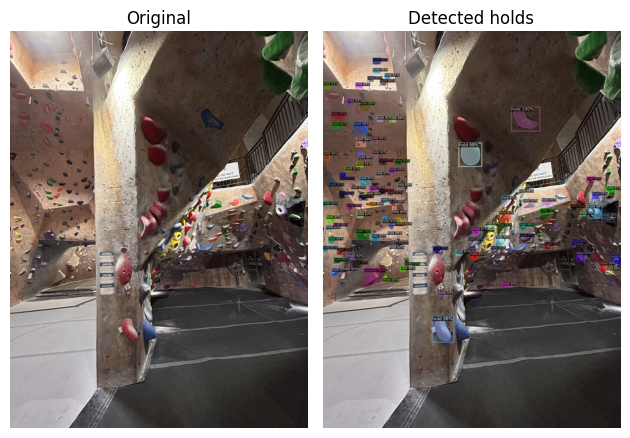

In [14]:

# Set metadata, in this case only the class names for plotting
MetadataCatalog.get("meta").thing_classes = ["hold", "volume"]
metadata = MetadataCatalog.get("meta")

predictor = DefaultPredictor(cfg)

img = cv2.imread(SAMPLE_IMAGE)
outputs = predictor(img)
v = Visualizer(
    img[:, :, ::-1],
    metadata=metadata
)

out_predictions = v.draw_instance_predictions(outputs["instances"].to("cpu"))
img_holds = out_predictions.get_image()
# display the results
fig, (ax1, ax2) = plt.subplots(1, 2)
ax1.imshow(img[:, :, ::-1])
ax1.axis('off')
ax1.set_title('Original')

ax2.imshow(img_holds)
ax2.axis('off')
ax2.set_title('Detected holds')

fig.tight_layout()
plt.show()

### Putting all our image inputs through pretrained model

IMG_8281.jpeg
IMG_7461.jpeg
IMG_8307.jpeg
IMG_8366.jpeg
IMG_8389.jpeg
IMG_7456.jpeg
IMG_8388.jpeg


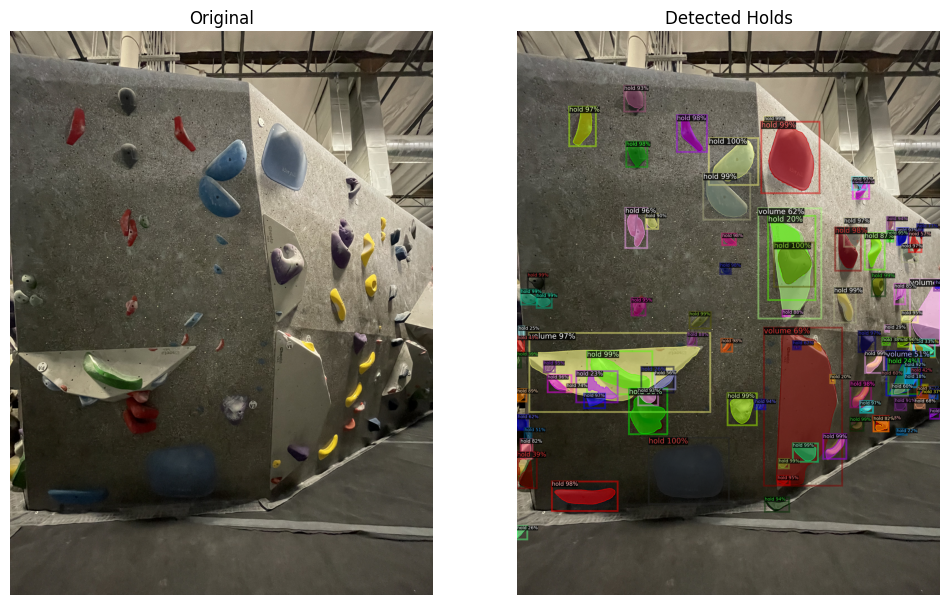

IMG_8326.jpeg


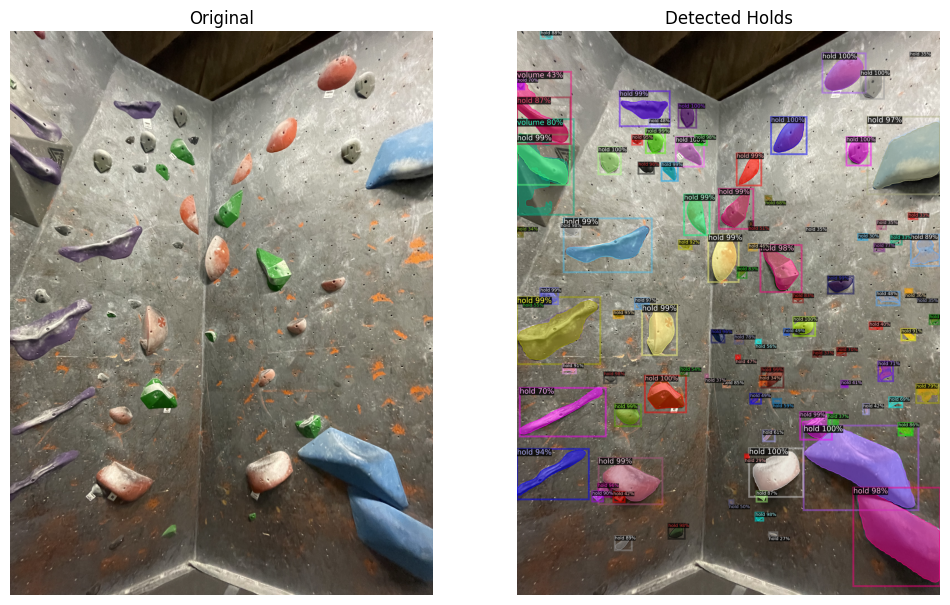

IMG_8371.jpeg


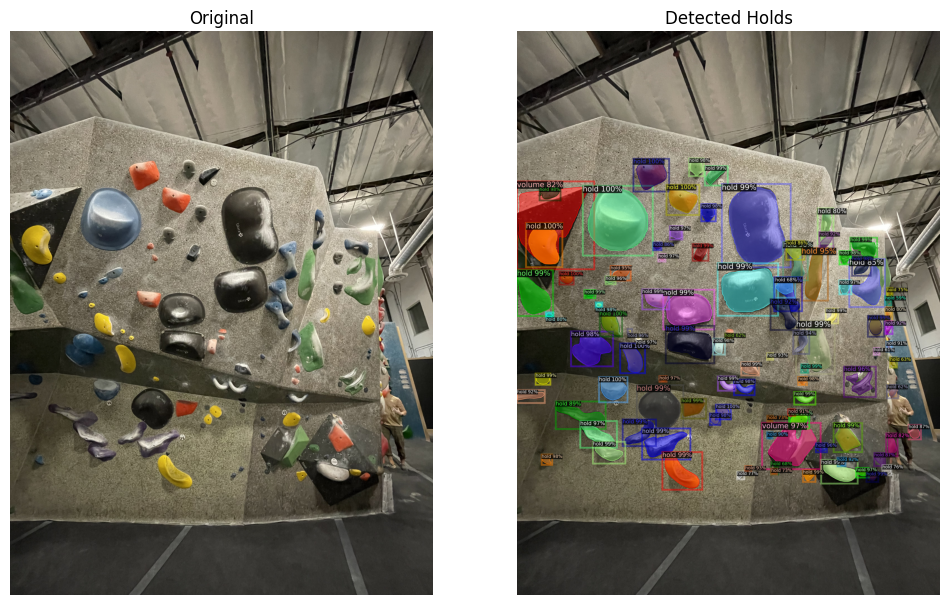

IMG_8351.jpeg


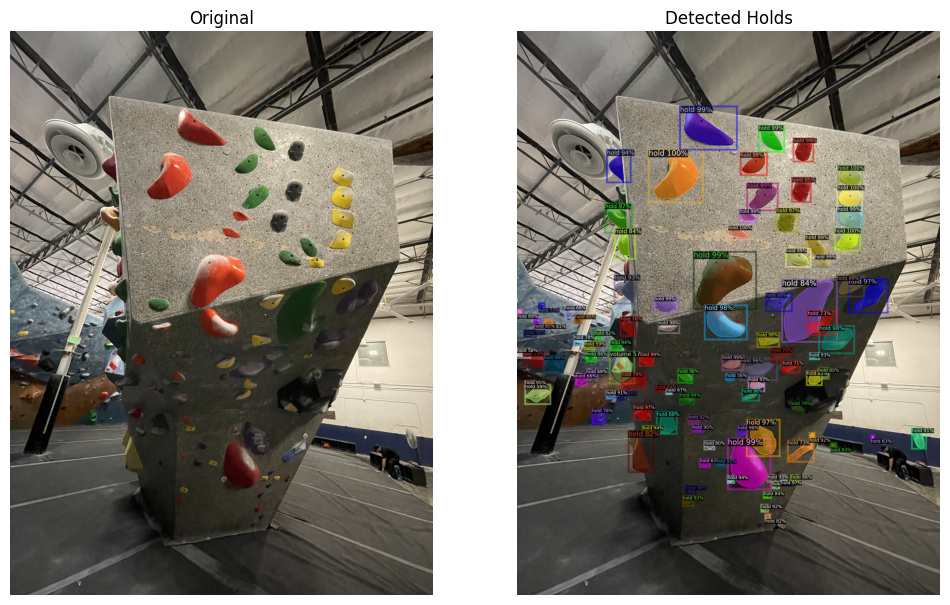

IMG_8310.jpeg


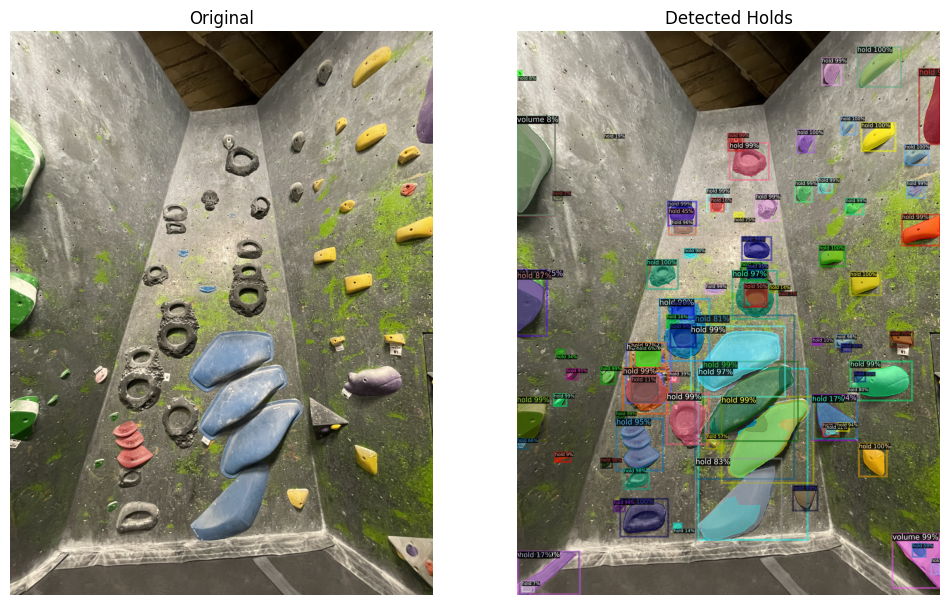

IMG_8384.jpeg


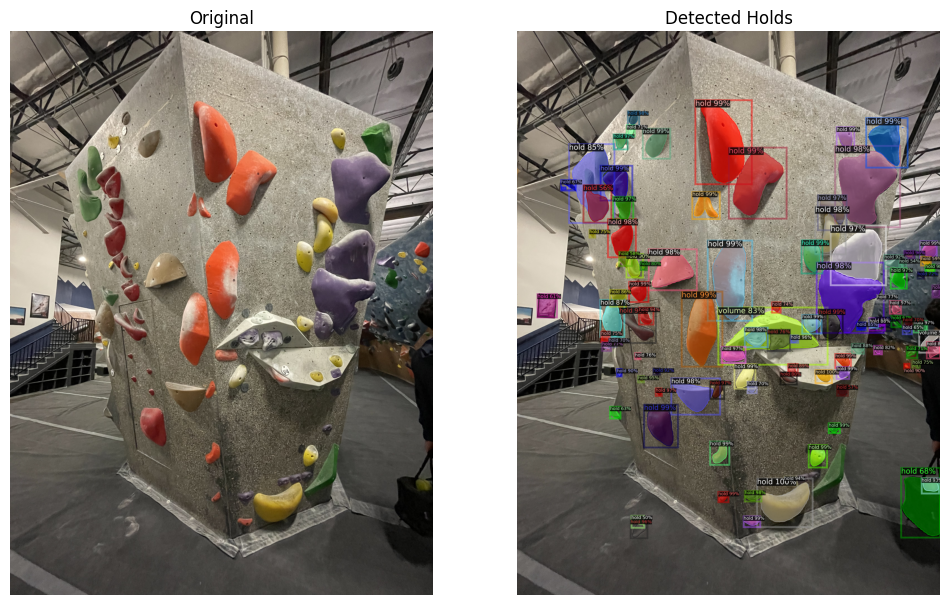

IMG_8296.jpeg


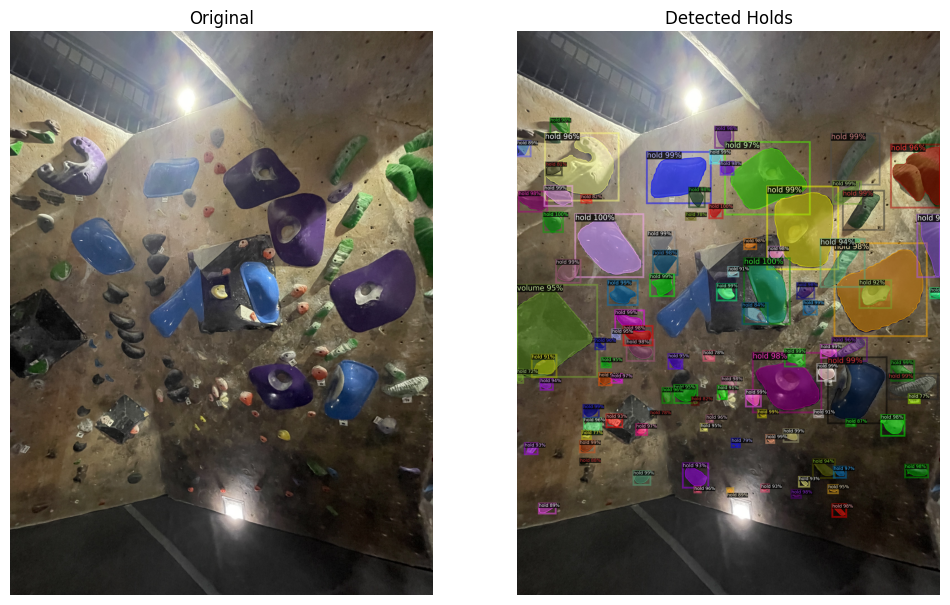

IMG_8279.jpeg


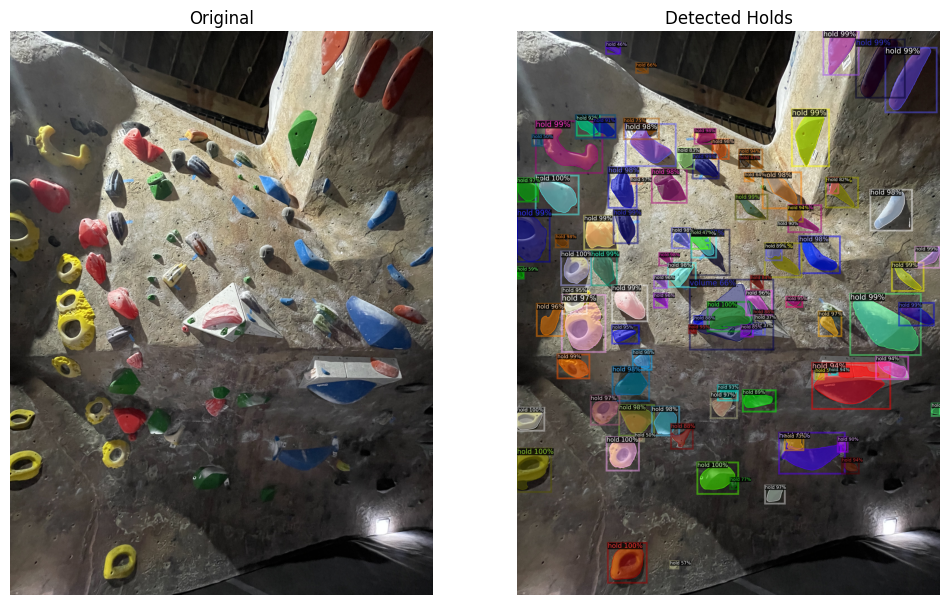

IMG_8392.jpeg


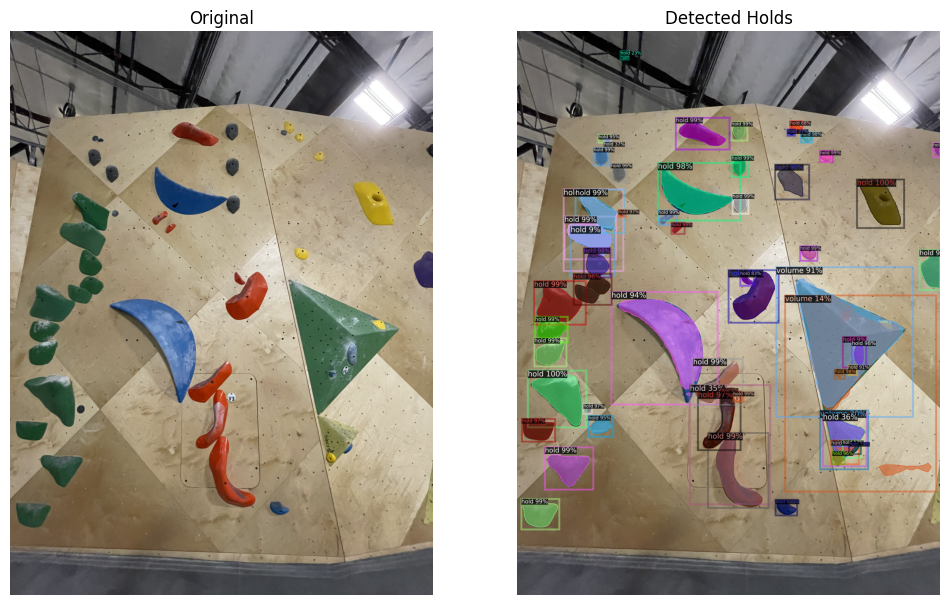

IMG_7283.JPG


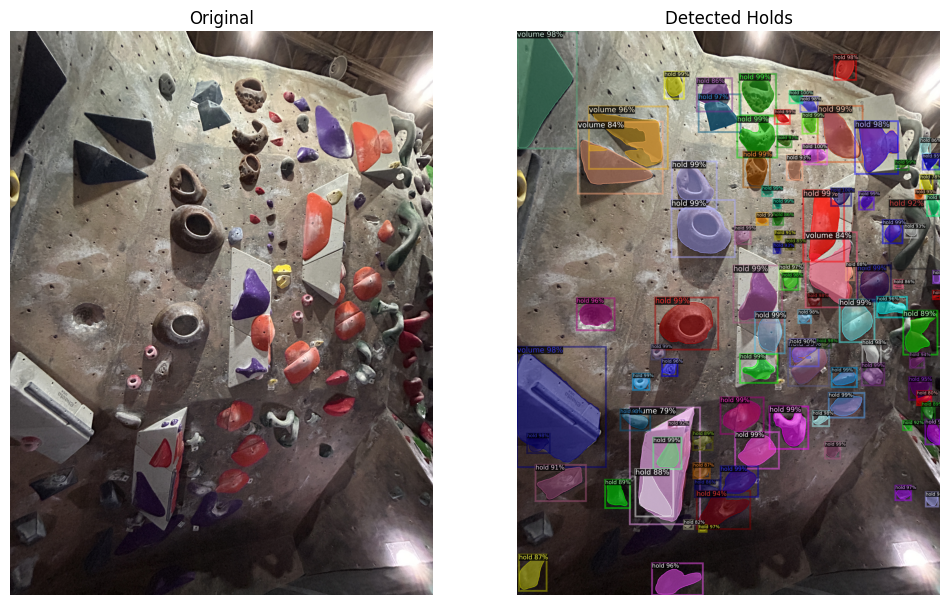

IMG_7321.JPG


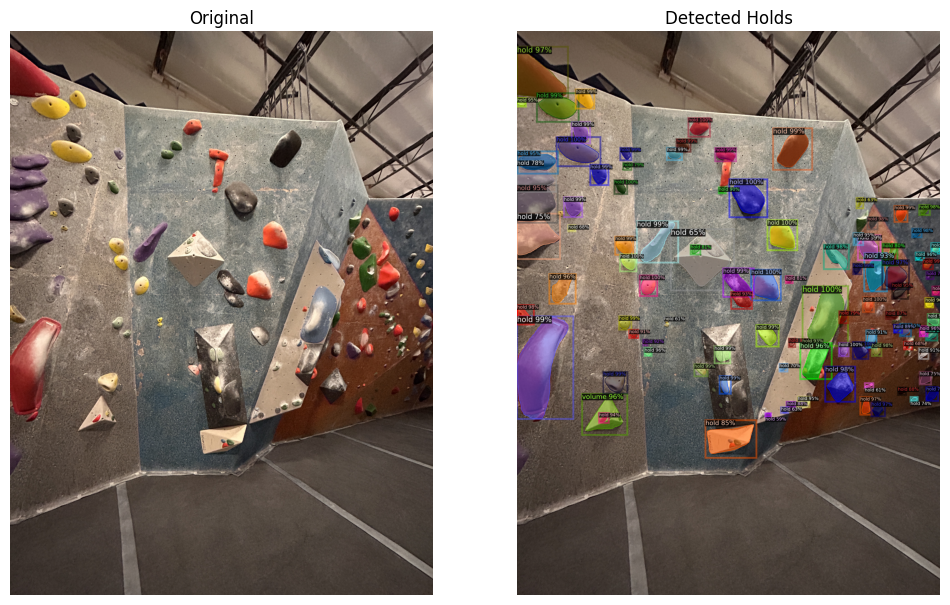

IMG_7282.JPG


In [ ]:

images_folder = "/Users/eden2025/MSAIF25/ml_project_msai/data/images"
output_folder = "/Users/eden2025/MSAIF25/ml_project_msai/data/predictions"   # optional
os.makedirs(output_folder, exist_ok=True)
outputs = []
count = 0

# Loop through all images
for filename in os.listdir(images_folder):
    print(filename)
    if not filename.lower().endswith((".jpg", ".jpeg", ".png")):
        continue

    img_path = os.path.join(images_folder, filename)
    img = cv2.imread(img_path)

    if img is None:
        print(f"⚠️ Could not read: {img_path}")
        continue

    # Run model inference
    outputs = predictor(img)
    # print(output)
    # outputs.append(output)
    
    

    # Visualize predictions
    if count > 5: 
        v = Visualizer(img[:, :, ::-1], metadata=metadata)
        vis_img = v.draw_instance_predictions(outputs["instances"].to("cpu")).get_image()

        # Display side-by-side
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 8))
        ax1.imshow(img[:, :, ::-1])
        ax1.axis("off")
        ax1.set_title("Original")

        ax2.imshow(vis_img)
        ax2.axis("off")
        ax2.set_title("Detected Holds")

        plt.show()
        
    count += 1

        # Save result (optional)
        # save_path = os.path.join(output_folder, filename)
        # cv2.imwrite(save_path, vis_img[:, :, ::-1])
        # print(f"Saved: {save_path}")

### Transforming Detectron output into COCO annotation format 

In [7]:

output_file_path = "/Users/eden2025/MSAIF25/ml_project_msai/data/coco_output_predictions.json"

output_folder = os.path.dirname(output_file_path)

In [10]:
import os
import json
import cv2
from detectron2.engine import DefaultPredictor
from detectron2.data import MetadataCatalog
from pycocotools import mask as mask_util

# Set metadata
MetadataCatalog.get("meta").thing_classes = ["hold", "volume"]
metadata = MetadataCatalog.get("meta")

predictor = DefaultPredictor(cfg)

images_folder = "/Users/eden2025/MSAIF25/ml_project_msai/data/images"
output_json_path = "/Users/eden2025/MSAIF25/ml_project_msai/data/predictions/coco_output_annotations.json"

coco = {
    "images": [],
    "annotations": [],
    "categories": [
        {"id": 1, "name": "hold", "supercategory": "hold"}
    ]
}

ann_id = 1
img_id = 1

for filename in os.listdir(images_folder):

    if not filename.lower().endswith((".jpg", ".jpeg", ".png")):
        continue

    img_path = os.path.join(images_folder, filename)
    img = cv2.imread(img_path)

    if img is None:
        print(f"⚠️ Could not read: {img_path}")
        continue

    height, width = img.shape[:2]

    output = predictor(img)
    instances = output["instances"].to("cpu")

    boxes = instances.pred_boxes.tensor.numpy()
    masks = instances.pred_masks.numpy()

    # ---- Add image entry ----
    coco["images"].append({
        "id": img_id,
        "width": width,
        "height": height,
        "file_name": filename,
        "license": 0,
        "flickr_url": "",
        "coco_url": "",
        "date_captured": 0
    })

    # ---- Loop through predictions ----
    for i in range(len(instances)):
        x1, y1, x2, y2 = boxes[i]
        bbox = [float(x1), float(y1), float(x2 - x1), float(y2 - y1)]

        # --------- FIX: Create uncompressed RLE safely ----------
        rle_compressed = mask_util.encode(
            masks[i].astype("uint8", order="F")
        )

        # Decode compressed RLE → get binary mask back
        decoded_mask = mask_util.decode(rle_compressed)

        # Convert back to uncompressed RLE (COCO expected format)
        rle_uncompressed = mask_util.encode(
            decoded_mask.astype("uint8", order="F")
        )
        rle_uncompressed["counts"] = list(rle_uncompressed["counts"])
        # ---------------------------------------------------------

        # Add annotation
        coco["annotations"].append({
            "id": ann_id,
            "image_id": img_id,
            "category_id": 1,
            "segmentation": rle_uncompressed,
            "bbox": bbox,
            "area": float(mask_util.area(rle_compressed)),
            "iscrowd": 0
        })

        ann_id += 1

    img_id += 1

# # Save JSON
# with open(output_json_path, "w") as f:
#     json.dump(coco, f, indent=2)

# print("✅ COCO annotations saved to:", output_json_path)


In [11]:

with open(output_file_path, "w") as f:
    json.dump(coco, f)

### Checking Created Annotations 

In [12]:
import json

json_path = "/Users/eden2025/MSAIF25/ml_project_msai/data/coco_output_predictions.json"

# # Load the COCO file
with open(json_path, "r") as f:
    coco = json.load(f)

annotations = coco.get("annotations", [])

# Print first 100 (or fewer if not available)
num_to_print = min(100, len(annotations))

print(f"Showing {num_to_print} of {len(annotations)} annotations:\n")

for i in range(num_to_print):
    ann = annotations[i]
    print(f"Annotation {i+1}:")
    print(json.dumps(ann, indent=2))
    print("-" * 80)


Showing 100 of 6765 annotations:

Annotation 1:
{
  "id": 1,
  "image_id": 1,
  "category_id": 1,
  "segmentation": {
    "size": [
      4032,
      3024
    ],
    "counts": [
      86,
      108,
      90,
      104,
      56,
      99,
      48,
      110,
      108,
      51,
      110,
      48,
      94,
      79,
      53,
      75,
      52,
      77,
      52,
      76,
      51,
      77,
      51,
      77,
      51,
      78,
      50,
      78,
      50,
      78,
      49,
      78,
      50,
      79,
      49,
      78,
      51,
      78,
      49,
      77,
      51,
      77,
      51,
      77,
      51,
      77,
      51,
      77,
      51,
      77,
      52,
      76,
      51,
      76,
      52,
      78,
      50,
      78,
      50,
      79,
      49,
      79,
      50,
      77,
      50,
      79,
      49,
      48,
      48,
      79,
      49,
      78,
      51,
      78,
      49,
      79,
      49,
      78,
      50,
      78,
      51,
      7

### Comparing to Other Annotations

In [2]:
import json

json_path = "/Users/eden2025/MSAIF25/ml_project_msai/data/annotations/hold_annotations2.json"

# Load the COCO file
with open(json_path, "r") as f:
    coco = json.load(f)

annotations = coco.get("annotations", [])

# Print first 100 (or fewer if not available)
num_to_print = min(100, len(annotations))

print(f"Showing {num_to_print} of {len(annotations)} annotations:\n")

for i in range(num_to_print):
    ann = annotations[i]
    print(f"Annotation {i+1}:")
    print(json.dumps(ann, indent=2))
    print("-" * 80)

Showing 100 of 754 annotations:

Annotation 1:
{
  "id": 1,
  "image_id": 1,
  "category_id": 1,
  "segmentation": {
    "counts": [
      5270210,
      9,
      4020,
      19,
      4011,
      24,
      4005,
      30,
      4000,
      35,
      3994,
      41,
      3989,
      46,
      3984,
      50,
      3980,
      54,
      3977,
      56,
      3974,
      60,
      3970,
      64,
      3966,
      67,
      3962,
      72,
      3958,
      77,
      3953,
      81,
      3950,
      85,
      3945,
      89,
      3942,
      93,
      3938,
      97,
      3933,
      102,
      3929,
      105,
      3926,
      108,
      3923,
      111,
      3920,
      113,
      3918,
      115,
      3916,
      118,
      3912,
      122,
      3909,
      125,
      3905,
      129,
      3902,
      132,
      3899,
      135,
      3895,
      138,
      3893,
      141,
      3890,
      143,
      3887,
      147,
      3884,
      150,
      3880,
      154,
      3877,